<a href="https://colab.research.google.com/github/PradyumnG/Paper-implementations/blob/main/CLIP/CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
hsankesara_flickr_image_dataset_path = kagglehub.dataset_download('hsankesara/flickr-image-dataset')
adityajn105_flickr8k_path = kagglehub.dataset_download('adityajn105/flickr8k')
keras_distil_bert_keras_distil_bert_base_en_uncased_2_path = kagglehub.model_download('keras/distil_bert/Keras/distil_bert_base_en_uncased/2')
keras_resnetv1_keras_resnet_50_imagenet_2_path = kagglehub.model_download('keras/resnetv1/Keras/resnet_50_imagenet/2')

print('Data source import complete.')


### Note: This notebook was executed in Kaggle since the Flickr8k dataset was readily available on the platform. To run this notebook, add the flickr-image-dataset to the input.

In [ ]:
import tensorflow as tf
import keras
import numpy as np
import PIL
from tqdm import tqdm
import keras_hub
import pandas as pd
from tensorflow.keras.utils import plot_model
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

## Constants

In [ ]:
EPOCHS = 5
IMG_SHAPE = (224, 224)

## Importing Flickr Image Dataset

In [ ]:
root_dir = '/kaggle/input/flickr8k/'
IMG_DIR = root_dir + 'Images'
CAPTIONS_DIR = root_dir + 'captions.txt'

In [ ]:
df = pd.read_csv(CAPTIONS_DIR)
df.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [ ]:
all_images = [f for f in os.listdir(IMG_DIR) if f.endswith('.jpg')]
captions_df = pd.read_csv(CAPTIONS_DIR)
train_files, test_files = train_test_split(all_images, test_size = 0.001)

train_df = captions_df[captions_df['image'].isin(train_files)]
test_df = captions_df[captions_df['image'].isin(test_files)]

#  column name for comment is ` comment` with a space at the start for flickr30k and caption for flickr8k
train_pairs = [(os.path.join(IMG_DIR, row['image']), row['caption']) for _, row in train_df.iterrows()]
test_pairs = [(os.path.join(IMG_DIR, row['image']), row['caption']) for _, row in test_df.iterrows()]

In [ ]:
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMG_SHAPE)
    return image

def preprocess(image_path, caption):
    image = load_image(image_path)
    return image, caption

def data_gen(pairs):
    for path, caption in pairs:
        yield path, caption

In [ ]:
def make_dataset(pairs, batch_size=128, shuffle=True):
    paths, captions = zip(*pairs)
    ds = tf.data.Dataset.from_generator(
        lambda: data_gen(pairs),
        output_signature=(
            tf.TensorSpec(shape=(), dtype=tf.string),
            tf.TensorSpec(shape=(), dtype=tf.string)
        )
    )
    ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

In [ ]:
train_ds = make_dataset(train_pairs)
test_ds = make_dataset(test_pairs, shuffle=False)

I0000 00:00:1760677696.691737      37 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1760677696.692519      37 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


## Text Encoder (DistilBert)

In [ ]:
class TextEncoder(keras.Model):
    def __init__(self, bert_checkpoint = 'distil_bert_base_en_uncased'):
        super().__init__()
        self.preprocessor = keras_hub.models.DistilBertTextClassifierPreprocessor.from_preset(bert_checkpoint)
        self.text_encoder = keras_hub.models.DistilBertBackbone.from_preset(bert_checkpoint)
        self.preprocessor.trainable = False
        self.text_encoder.trainable = False

    def call(self, text):
        return self.text_encoder(self.preprocessor(text))

## Image Encoder (Resnet-50)

In [ ]:
class ImageEncoder(keras.Model):
    def __init__(self, resnet_checkpoint = 'resnet_50_imagenet'):
        super().__init__()
        self.preprocessor = keras_hub.layers.ResNetImageConverter.from_preset(resnet_checkpoint)
        self.image_encoder = keras_hub.models.ResNetBackbone.from_preset(resnet_checkpoint)
        self.preprocessor.trainable = False
        self.image_encoder.trainable = False

    def call(self, image):
        return self.image_encoder(self.preprocessor(image))

## Final projection head

In [ ]:
class ProjectionHead(keras.layers.Layer):
    def __init__(self, ndim=256, variant='text'):
        super().__init__()
        self.dense = keras.layers.Dense(units=ndim)
        self.pooling_layer = keras.layers.Identity()
        self.variant = variant
        if self.variant == 'image':
            self.pooling_layer = keras.layers.GlobalAveragePooling2D()

    def call(self, x):
        if self.variant == 'text':
            # Extract the CLS token for further processing, reducing one dimension
            return self.dense(x[:,0,:])
        else:
            return self.dense(self.pooling_layer(x))

## Model definition for Clip

In [ ]:
class Clip(keras.Model):
    def __init__(self):
        super().__init__()
        self.image_encoder = ImageEncoder()
        self.text_encoder = TextEncoder()
        self.image_proj = ProjectionHead(variant='image')
        self.text_proj = ProjectionHead(variant='text')
        self.temperature = tf.Variable(initial_value=0.5, dtype=tf.float32)

    def call(self, inputs):
        images, captions = inputs

        text_emb = self.text_proj(self.text_encoder(captions))
        img_emb = self.image_proj(self.image_encoder(images))

        return img_emb, text_emb

    def find_most_relevant_image(self, caption, images):
        # Add a batch dimension since I'll only be passing one caption
        batched_caption = tf.expand_dims(caption, axis=0)

        img_emb, text_emb = self.call((images, batched_caption))

        img_emb = tf.math.l2_normalize(img_emb, axis=1)
        text_emb = tf.math.l2_normalize(text_emb, axis=1)

        cos_sim = img_emb @ tf.transpose(text_emb)

        return tf.argmax(tf.squeeze(cos_sim))

## Training

In [ ]:
model = Clip()
optimizer = tf.keras.optimizers.Adam()

In [ ]:
@tf.function
def train_step(inputs, model, optimizer):
    images, captions = inputs
    images_shape = tf.shape(images)
    batch_size = images_shape[0]

    with tf.GradientTape() as tape:
        img_emb, text_emb = model(inputs, training=True)

        img_emb = tf.math.l2_normalize(img_emb, axis=1)
        text_emb = tf.math.l2_normalize(text_emb, axis=1)


        cos_sim = (img_emb @ tf.transpose(text_emb)) * tf.exp(model.temperature)
        labels = tf.range(batch_size)

        loss_i = tf.keras.losses.sparse_categorical_crossentropy(labels, cos_sim, from_logits=True)
        loss_t = tf.keras.losses.sparse_categorical_crossentropy(labels, tf.transpose(cos_sim), from_logits=True)
        loss = tf.reduce_mean(loss_i + loss_t)

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return loss

In [ ]:
for epoch in range(EPOCHS):
    total_loss = 0.0
    batches = 0
    for inputs in tqdm(train_ds):
        loss = train_step(inputs, model, optimizer)
        total_loss += loss
        batches += 1
        # print(f"Batch completed, batch loss: {loss}")

    print(f"Epoch: {epoch}, loss: {total_loss/batches}")

0it [00:00, ?it/s]I0000 00:00:1760677733.248465      98 cuda_dnn.cc:529] Loaded cuDNN version 90300
316it [18:07,  3.44s/it]


Epoch: 0, loss: 7.932480335235596


316it [18:01,  3.42s/it]


Epoch: 1, loss: 7.632295608520508


316it [17:57,  3.41s/it]


Epoch: 2, loss: 7.566948413848877


316it [18:00,  3.42s/it]


Epoch: 3, loss: 7.53049373626709


316it [18:09,  3.45s/it]


Epoch: 4, loss: 7.502105236053467


## Testing (verify if images in training data are being matched correctly)

In [ ]:
def plot_images(images, labels, scores):
    batch = images.shape[0]
    fig, axes = plt.subplots(batch, 2, figsize=(8, 3 * batch),
                             gridspec_kw={'width_ratios': [3, 1], 'wspace': 0.3})
    if batch == 1:
        axes = axes.reshape(1, -1)

    for i in range(batch):
        # Display image on the left
        ax_img = axes[i, 0]
        ax_img.imshow(images[i]/255.0)
        ax_img.axis('off')

        # Display labels on the right
        ax_text = axes[i, 1]
        ax_text.axis('off')

        # Find top 2 indices and labels
        top2_idx = np.argsort(scores[i])[-2:][::-1]
        top2_labels = [labels[j] for j in top2_idx]
        top2_scores = [scores[i][j] for j in top2_idx]

        # Determine colors for each top label
        color_top1 = 'green' if top2_idx[0] == i else 'red'
        color_top2 = 'green' if top2_idx[1] == i else 'red'

        # Display Top 1 label
        text1 = ax_text.text(0.1, 0.65, f"Top 1: {top2_labels[0]}\n({top2_scores[0]:.2f})",
                            fontsize=12, verticalalignment='center',
                            transform=ax_text.transAxes, color=color_top1)

        # Display Top 2 label
        text2 = ax_text.text(0.1, 0.35, f"Top 2: {top2_labels[1]}\n({top2_scores[1]:.2f})",
                            fontsize=12, verticalalignment='center',
                            transform=ax_text.transAxes, color=color_top2)

    plt.tight_layout()
    plt.show()

In [ ]:
def test_model_predictions(iterator):
    batch = next(iterator)
    images, labels = batch
    images = images[:10]
    labels = labels[:10]

    img_emb, text_emb = model((images, labels), training=False)
    cos_sim = (img_emb @ tf.transpose(text_emb)) * tf.exp(model.temperature)

    sim_score = tf.nn.softmax(cos_sim, axis = 1)

    plot_images(images, labels, sim_score)

/tmp/ipykernel_37/3860735102.py:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


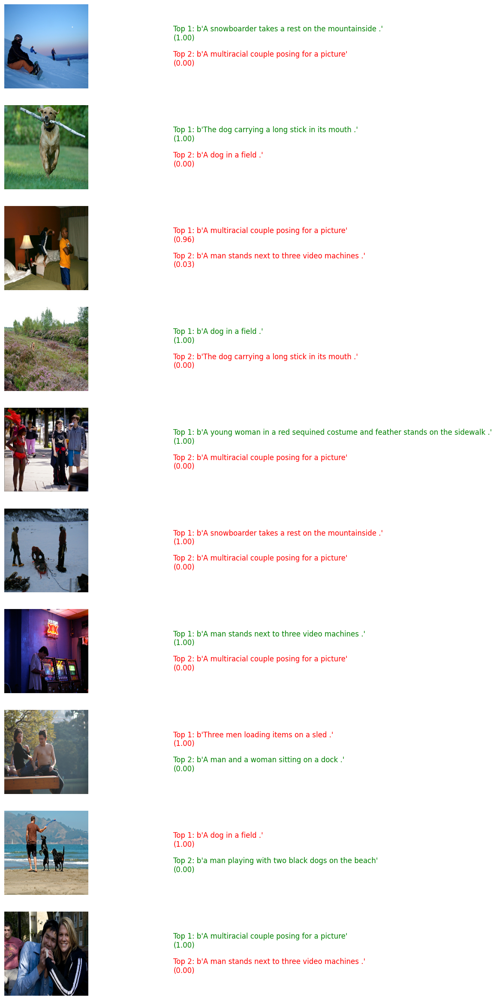

In [ ]:
# print the image and captions array for a randomly sampled batch (do this after training and before test generation)
test_model_predictions(iter(train_ds))

## Test (on holdout set)

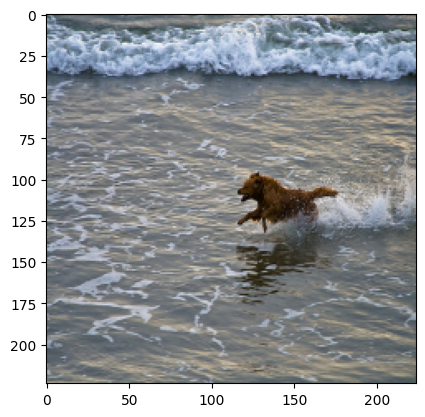

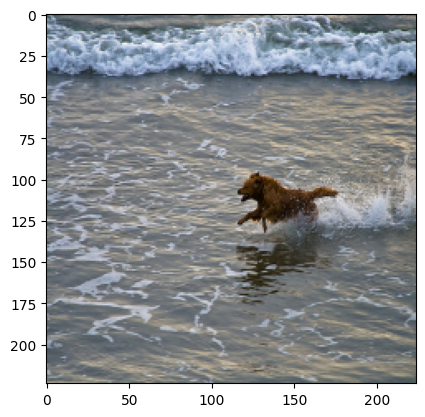

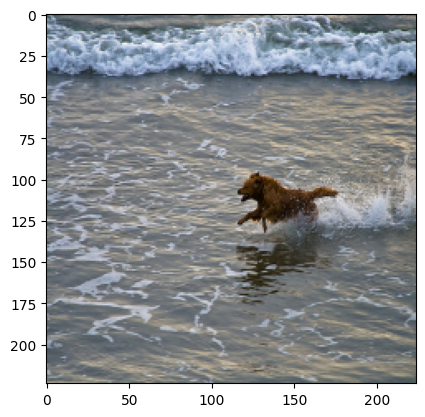

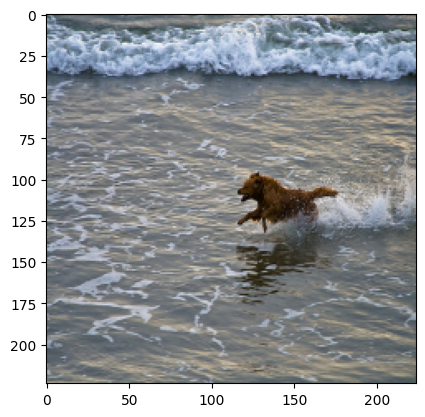

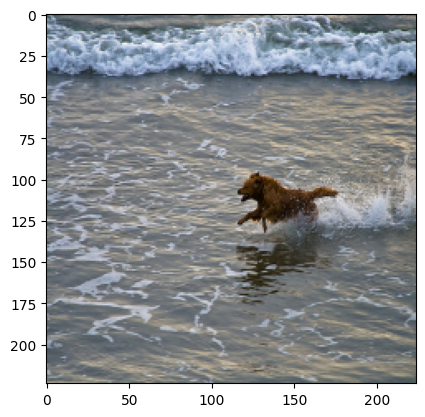

...

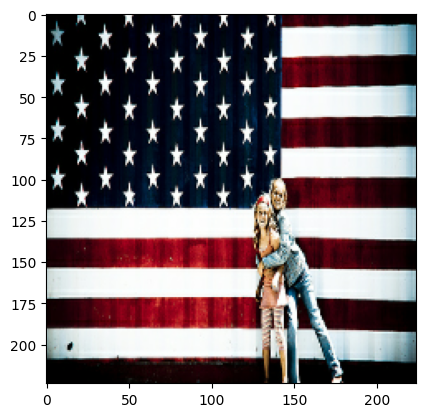

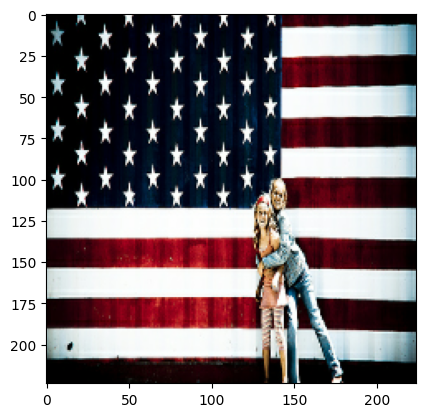

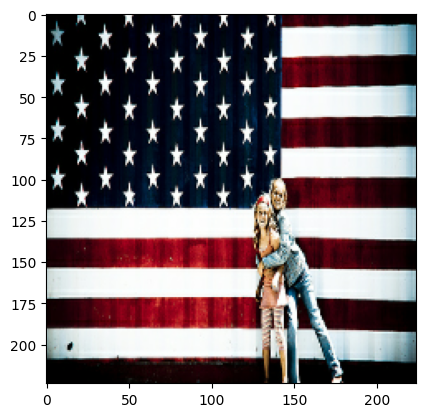

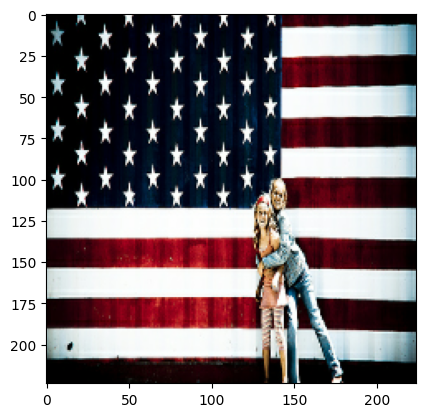

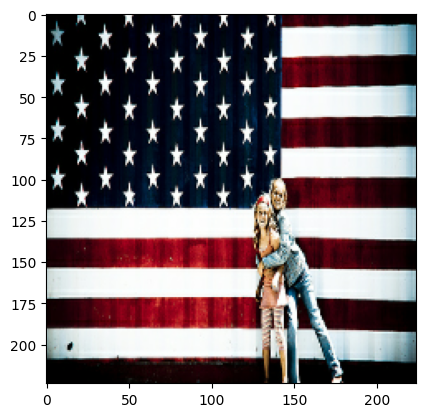

In [ ]:
## Print all images in holdout set
test_iter = iter(test_ds)
batch = next(test_iter)

images, labels = batch

for image in images:
    plt.imshow(image/255.0)
    plt.show()

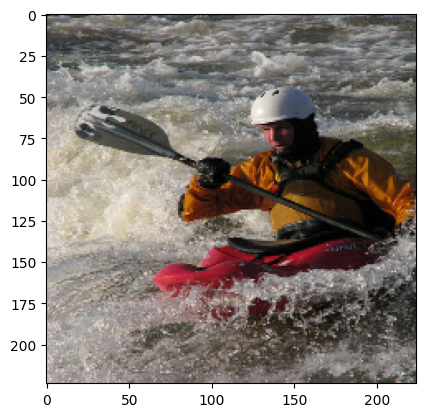

In [ ]:
## Take user input for caption, and then print the most likely image from holdout set
index = model.find_most_relevant_image(tf.constant("Rafting"), images)

plt.imshow(images[index]/255.0)

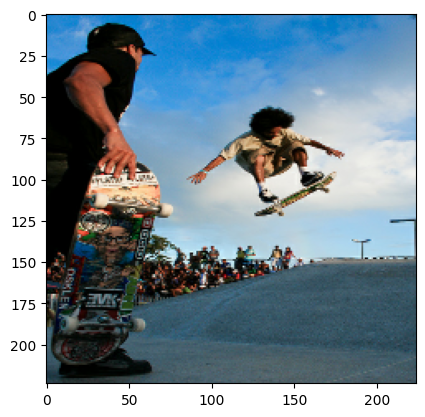

In [ ]:
index = model.find_most_relevant_image(tf.constant("A man jumping with a skateboard"), images)

plt.imshow(images[index]/255.0)